# Clonal clustering w scLiTr 

Clustering of clones to compare lineage plasiticity of RG between stages, species and perturbations

In [2]:
import scanpy as sc
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import sclitr as sl
import os

sc.set_figure_params(dpi=80)
sns.set_style("ticks")

In [55]:
adata = sc.read('/wynton/group/pollen/jding/brainchromatin/HM2D/HM2D-filtered_guides.h5ad', compression='gzip')
adata.obs['Gene_target'] = adata.obs['gene_NKS'] 
targets = [x for x in adata.obs['Gene_target'].unique() if x in adata.var_names]
targets.append('non-targeting')
adata = adata[adata.obs['Gene_target'].isin(targets)]
adata.obs['sex'] = [x.split('-')[-1] for x in adata.obs['individual']]
adata.obs['stage'] = [x.split('#')[0] for x in adata.obs['individual']]
adata.obs['perturbation'] = ['NT' if x in ['WT','non-targeting'] else 'Perturbed' for x in adata.obs['gene_NKS']]

/scratch/jding/ipykernel_3269609/1272429292.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['sex'] = [x.split('-')[-1] for x in adata.obs['individual']]


/wynton/home/pollenlab/jding/miniconda3/envs/cospar/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


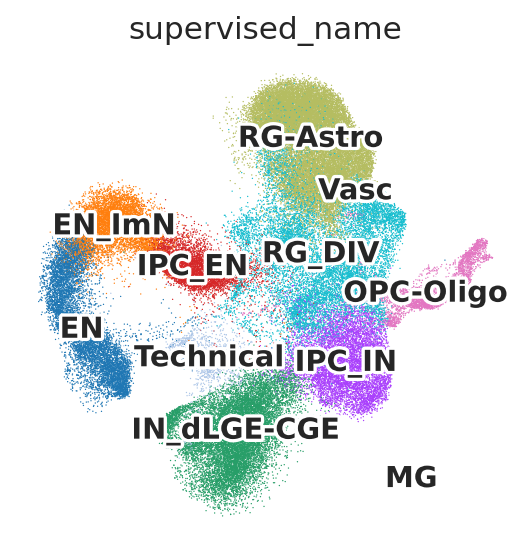

In [56]:
sc.pl.umap(adata, color='supervised_name', legend_loc='on data',
           frameon=False, legend_fontsize=13, legend_fontoutline=3,save='leiden')

In [58]:
adata = adata[adata.obs["clone_barcode_criteria"] != 'no_clones_found']
adata.obs["unique_clone"] = adata.obs["clone_barcode"].astype(str) + adata.obs["individual"].astype(str)
adata.obs["time_info"] = '0'
adata.obs["time_info"].value_counts()

/scratch/jding/ipykernel_3269609/3640936254.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["unique_clone"] = adata.obs["clone_barcode"].astype(str) + adata.obs["individual"].astype(str)


time_info
0    72364
Name: count, dtype: int64

In [38]:
#subset clones with >2 cells
df = adata.obs['unique_clone'].value_counts().reset_index(name='cellcounts')
multiclones = df[df['cellcounts'] > 2 ]['unique_clone'].values
adata =  adata[adata.obs['unique_clone'].isin(multiclones)]

/scratch/jding/ipykernel_3269609/801215481.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tmp['unique_clone'] = df_tmp['unique_clone'].astype(str)
/scratch/jding/ipykernel_3269609/801215481.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tmp["class"] = df_tmp["class"].astype(str)


Text(0.5, 1.0, 'Clones human')

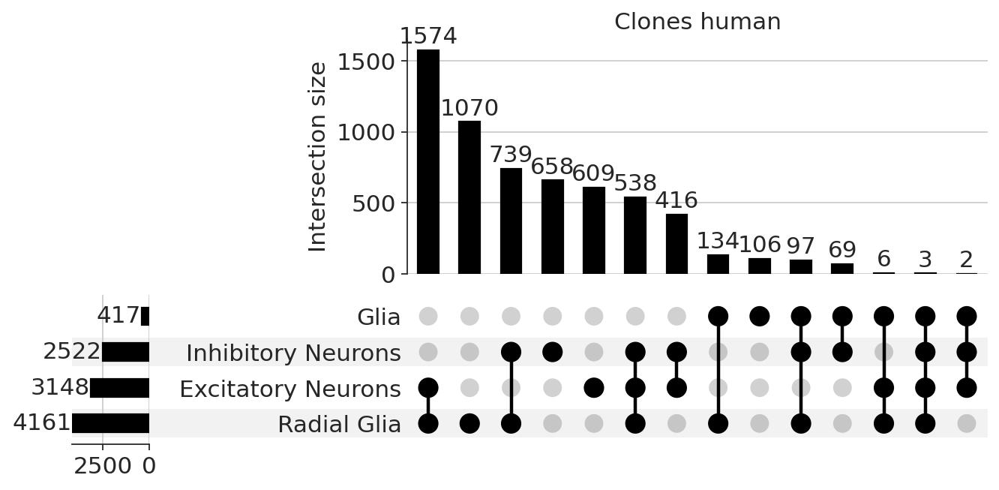

In [39]:
import upsetplot
species = 'human'

n_clones = len(set(adata[adata.obs['species'] == species].obs['unique_clone']))

df_tmp = adata.obs[adata.obs['species'] == species]
df_tmp['unique_clone'] = df_tmp['unique_clone'].astype(str)
df_tmp["class"] = df_tmp["class"].astype(str)
df_tmp = [list(i) for i in df_tmp.groupby(['unique_clone'])["class"].unique()]
df_tmp = upsetplot.from_memberships(df_tmp)

axes = upsetplot.UpSet(df_tmp, subset_size="count", sort_by="cardinality",
                       show_counts=True, min_subset_size=(n_clones * 0)).plot()
axes["intersections"].set_title("Clones " + species)

#plt.savefig(f"../figures/fig1/{timepoint}_Trunk_UpSet.pdf", bbox_inches="tight")

/scratch/jding/ipykernel_3269609/3810057333.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tmp['unique_clone'] = df_tmp['unique_clone'].astype(str)
/scratch/jding/ipykernel_3269609/3810057333.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tmp["class"] = df_tmp["class"].astype(str)


Text(0.5, 1.0, 'Clones macaque')

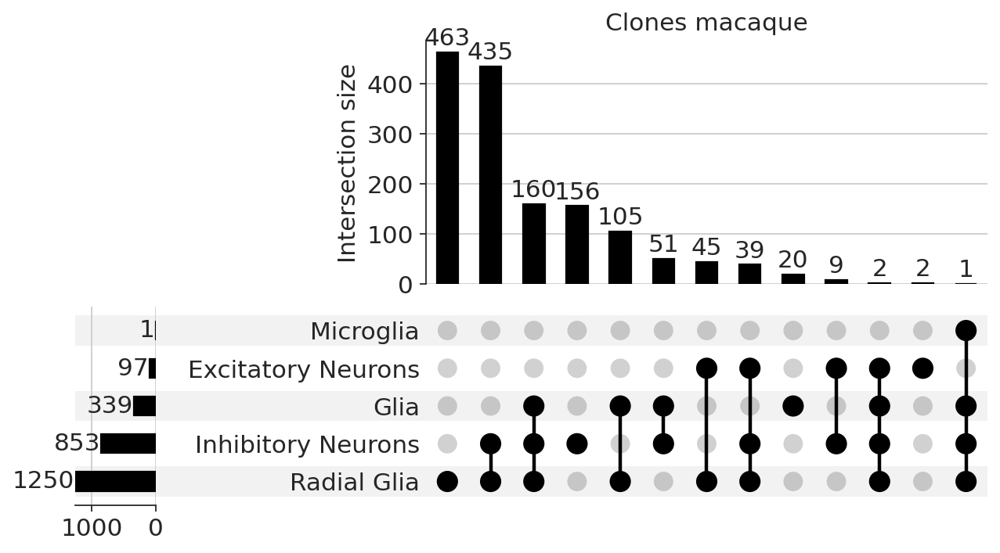

In [40]:
import upsetplot
species = 'macaque'

n_clones = len(set(adata[adata.obs['species'] == species].obs['unique_clone']))

df_tmp = adata.obs[adata.obs['species'] == species]
df_tmp['unique_clone'] = df_tmp['unique_clone'].astype(str)
df_tmp["class"] = df_tmp["class"].astype(str)
df_tmp = [list(i) for i in df_tmp.groupby(['unique_clone'])["class"].unique()]
df_tmp = upsetplot.from_memberships(df_tmp)

axes = upsetplot.UpSet(df_tmp, subset_size="count", sort_by="cardinality",
                       show_counts=True, min_subset_size=(n_clones * 0)).plot()
axes["intersections"].set_title("Clones " + species)

#plt.savefig(f"../figures/fig1/{timepoint}_Trunk_UpSet.pdf", bbox_inches="tight")

In [112]:
#define 'sgRNA_effecitve' as sgRNAs that are not non-targeting
adata.obs['sgRNA_effecitve'] = [','.join(list(set(i for i in x.split(',') if not i.lower().startswith('non-targeting')))) for x in adata.obs['sgRNA'].astype(str)]
adata.obs['sgRNA_effecitve'] = ['non-targeting' if x == '' else x for x in adata.obs['sgRNA_effecitve']]
adata.obs['num_sgRNA_effective'] = [len(list(set(x.split(',')))) for x in adata.obs['sgRNA_effecitve'].astype(str)]
#adata = adata[adata.obs['num_sgRNA_effective'] == 1]

<Axes: xlabel='max_percentage', ylabel='Count'>

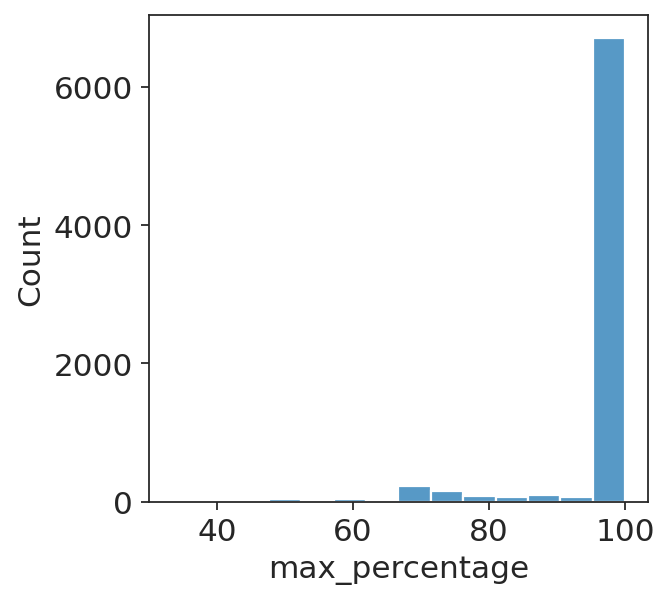

In [15]:
df = adata.obs.groupby(["unique_clone","gene_NKS"]).size().reset_index(name="count")
df = df[df['count'] != 0]
df['total_count'] = df.groupby('unique_clone')['count'].transform('sum')
df['percentage'] = (df['count'] / df['total_count']) * 100
df['max_percentage'] = df.groupby('unique_clone')['percentage'].transform('max')
df = df.sort_values(by='max_percentage', ascending=False)
df = df.drop_duplicates(subset='unique_clone', keep="first")
import seaborn 
sns.histplot(data=df[df['total_count'] > 2], x="max_percentage")

In [16]:
adata = adata[adata.obs['unique_clone'].isin(df[df['max_percentage'] == 100]['unique_clone'])]

In [115]:
sl.tl.clonal_nn(
    adata,
    obs_name="unique_clone", # Column with clonal labels
    use_rep="X_scANVI", # Which dimred use for graph construction
    min_size=3, # Minimal clone size
)

In [116]:
clones = sl.tl.clone2vec(
    adata,
    obs_name="unique_clone", # Column with clonal labels
    fill_ct="supervised_name", # Column with cell type annotation to fill `clones.X`
)

100%|█████████████████████████████████████████| 100/100 [37:21<00:00, 22.41s/it]


In [117]:
sc.pp.neighbors(clones, use_rep="word2vec")
sc.tl.umap(clones)
sc.tl.leiden(clones)

Secondly, let's explore the distribution of clone sizes.

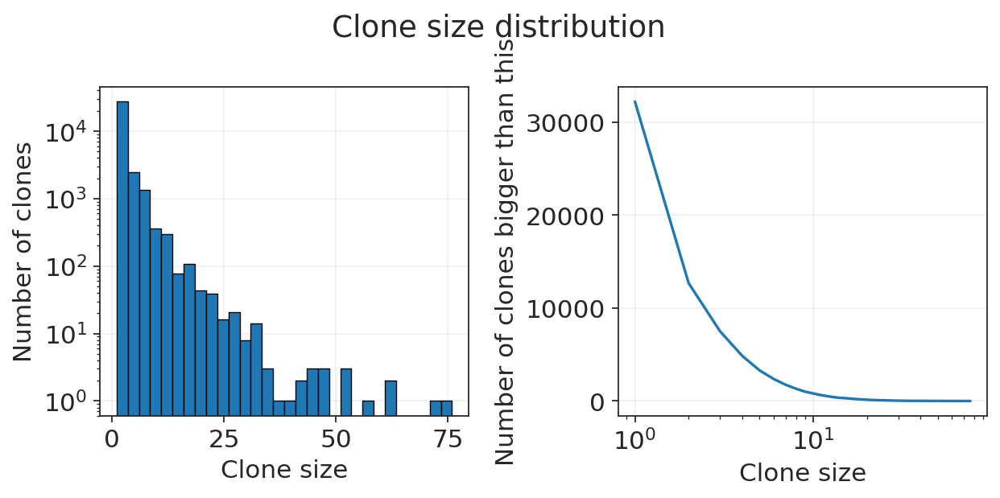

In [8]:
sl.pl.basic_stats(adata, obs_name="unique_clone", title="Clone size distribution")

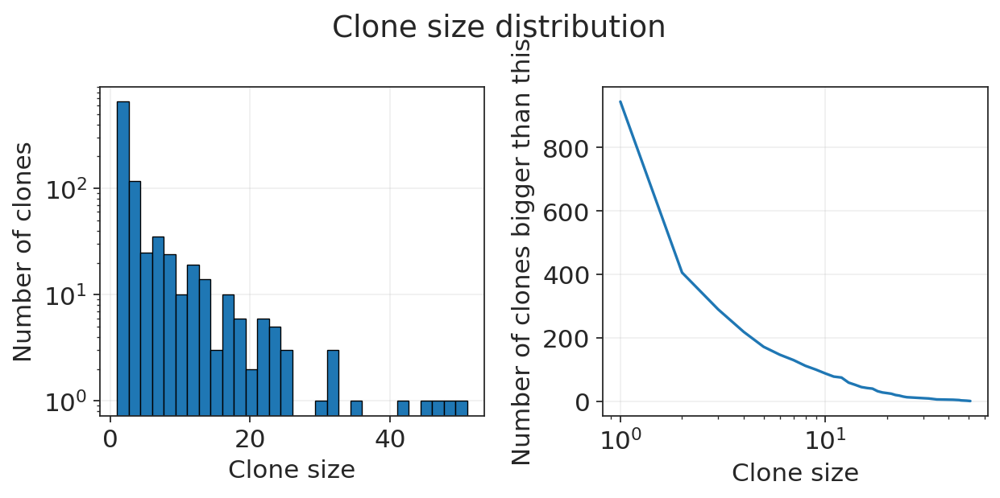

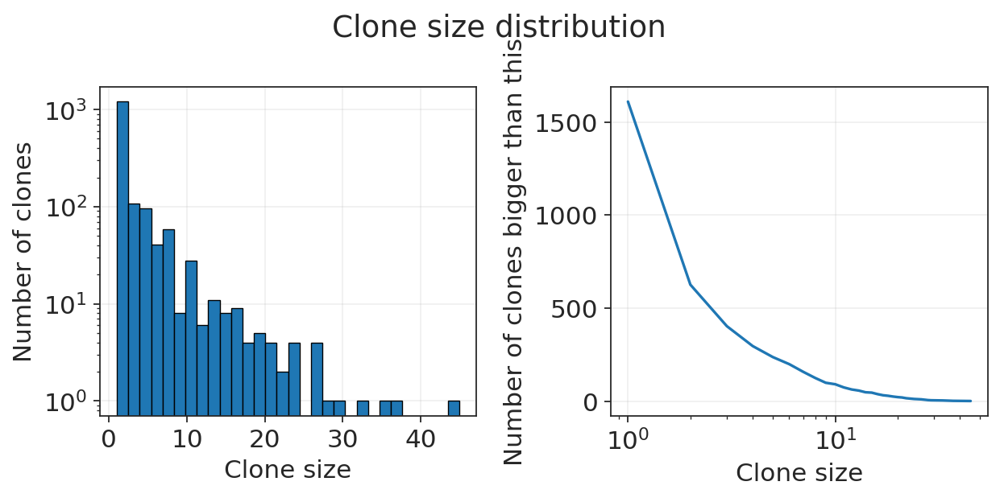

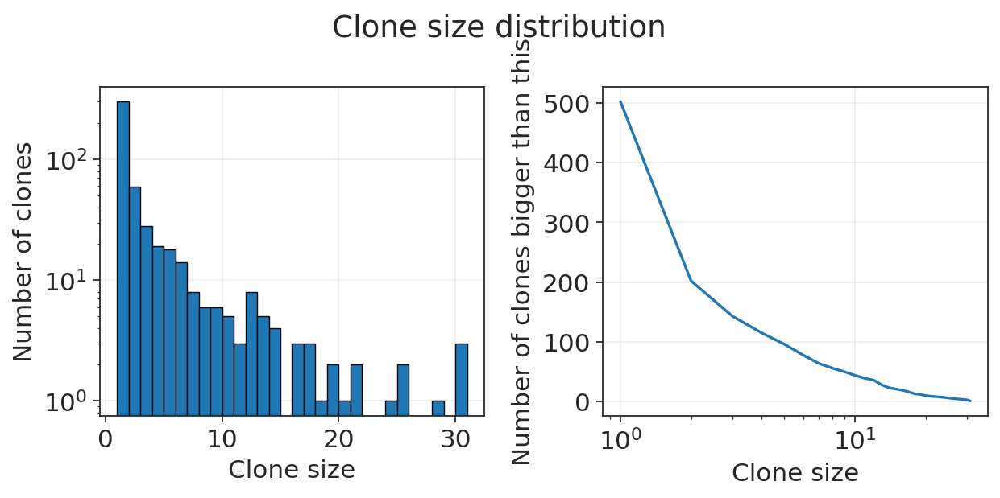

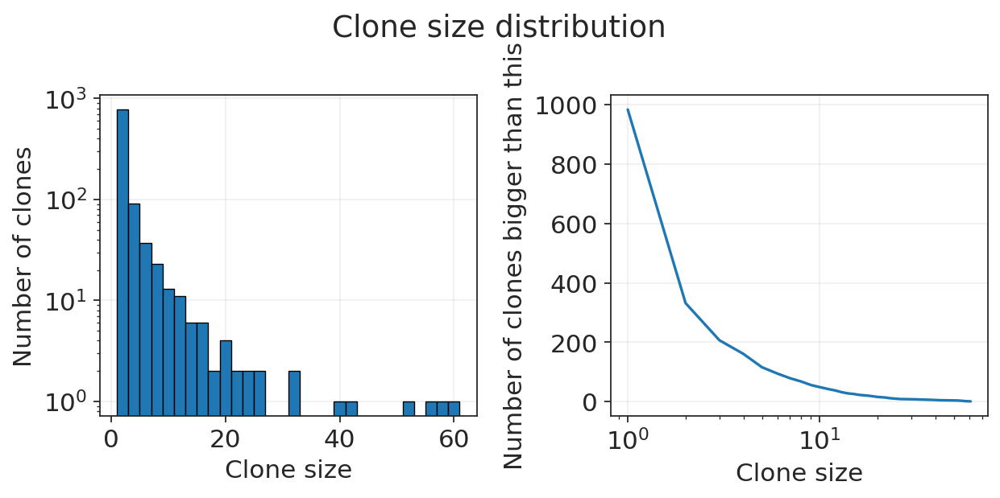

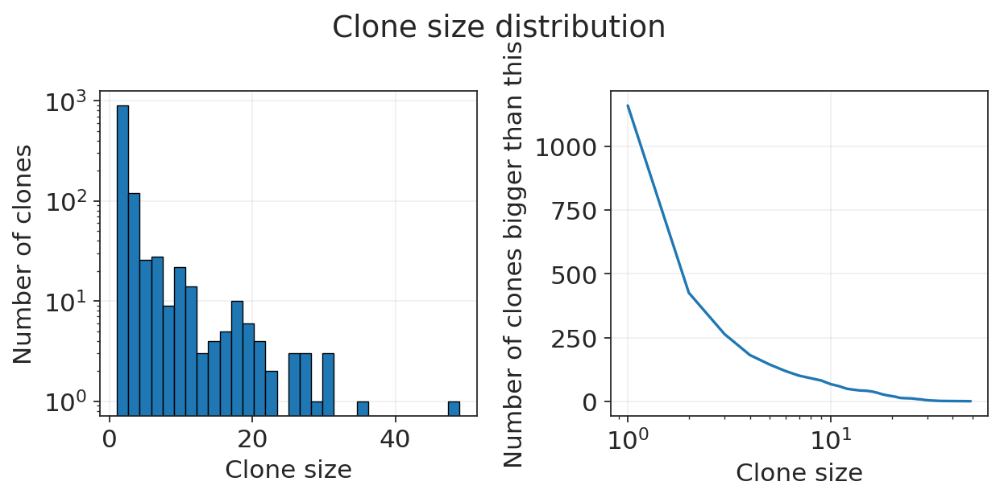

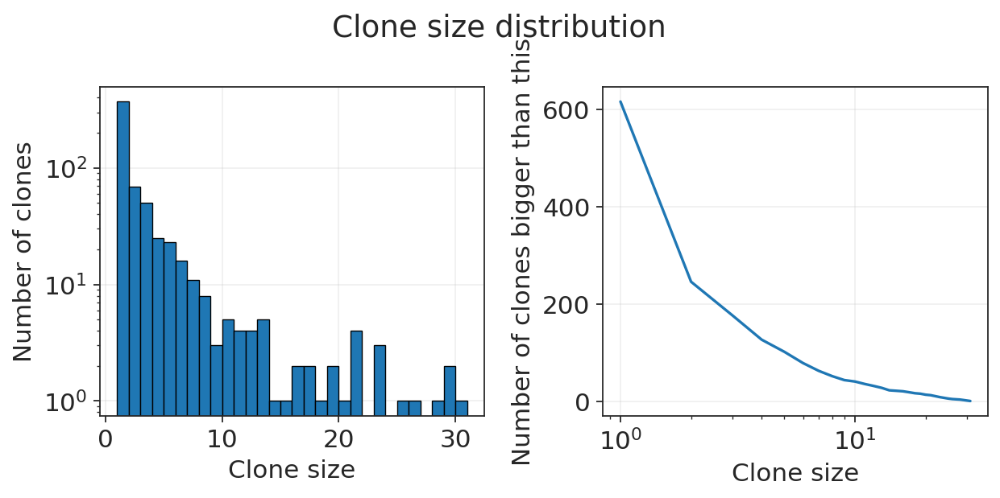

In [9]:
sl.pl.basic_stats(adata[adata.obs['gene_NKS'] == 'non-targeting'], obs_name="unique_clone", title="Clone size distribution")
sl.pl.basic_stats(adata[adata.obs['gene_NKS'] == 'ARX'], obs_name="unique_clone", title="Clone size distribution")
sl.pl.basic_stats(adata[adata.obs['gene_NKS'] == 'NR2E1'], obs_name="unique_clone", title="Clone size distribution")
sl.pl.basic_stats(adata[adata.obs['gene_NKS'] == 'ZNF219'], obs_name="unique_clone", title="Clone size distribution")
sl.pl.basic_stats(adata[adata.obs['gene_NKS'] == 'SOX2'], obs_name="unique_clone", title="Clone size distribution")
sl.pl.basic_stats(adata[adata.obs['gene_NKS'] == 'NEUROD2'], obs_name="unique_clone", title="Clone size distribution")

Now, let's find clonally labeled nearest neighbours for each cell.

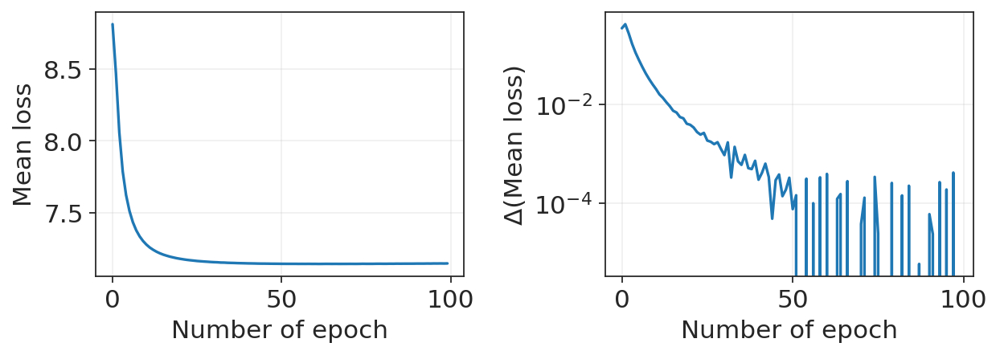

In [9]:
sl.pl.epochs_loss(clones)

Now, let's construct kNN-graph and UMAP based on latent representation of the clones.

In [118]:
sc.pp.neighbors(clones, use_rep="word2vec", n_neighbors=15)
sc.tl.umap(clones)

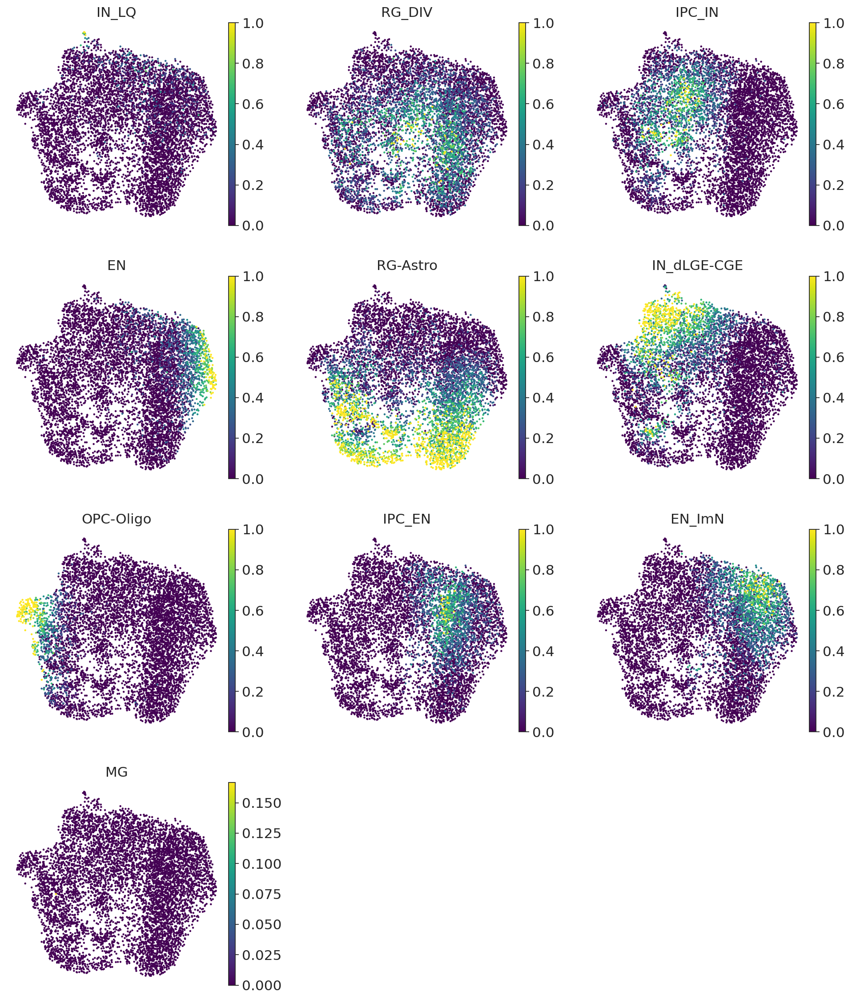

In [11]:
sc.pl.umap(
    clones,
    color=adata.obs['supervised_name'].unique(),
    layer="frequencies",
    frameon=False,
    cmap="viridis",
    ncols=3,
)

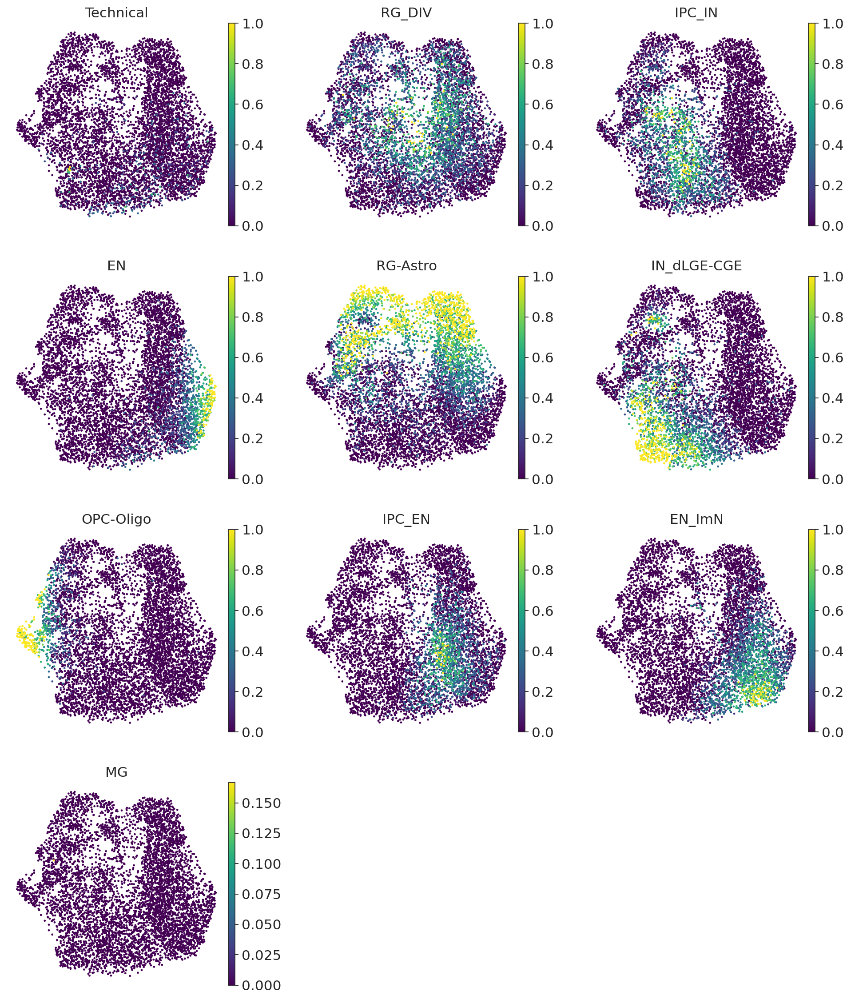

In [119]:
sc.pl.umap(
    clones,
    color=adata.obs['supervised_name'].unique(),
    layer="frequencies",
    frameon=False,
    cmap="viridis",
    ncols=3,
)

In [120]:
map = adata.obs[['unique_clone', 'gene_NKS']].set_index('unique_clone').to_dict()['gene_NKS']
clones.obs['gene_NKS'] = [map[x] for x in clones.obs.index]
clones.obs.head(5)

,n_cells,leiden,gene_NKS
CAAACCCCTGGCGATGGGATCAACACCTGCCGTGTTGCTAGGTAACGGCGACGGCCCTGW22#147-M,3,11,SOX2
CAAACCCCTGGCGATGGGATCACTCGGTTCCTTAGGGCTAGCACATACGTGACCACCTGW18#183-M,9,0,ZNF219
CAAACCCCTGGCGATGGGATCATCGTACGAGGGAGGGCTAGCTGACAACTCTCCGTCTGW18#183-M,12,0,ARX
CAAACCCCTGGCGATGGGATCCAACCGCTCTATAGGGCTAGATTGCACGCGTTCGTCTE80#12-M,6,11,non-targeting
CAAACCCCTGGCGATGGGATCCCAACCCCGTGGCTCGCTAGAGGGCGAAGTGTGACCTGW17#136-F,3,4,ZNF219


In [26]:
#define 'sgRNA_effecitve' as sgRNAs that are not non-targeting
adata.obs['sgRNA_effecitve'] = [','.join(list(set(i for i in x.split(',') if not i.lower().startswith('non-targeting')))) for x in adata.obs['sgRNA'].astype(str)]
adata.obs['sgRNA_effecitve'] = ['non-targeting' if x == '' else x for x in adata.obs['sgRNA_effecitve']]
adata.obs['num_sgRNA_effective'] = [len(list(set(x.split(',')))) for x in adata.obs['sgRNA_effecitve'].astype(str)]
#adata = adata[adata.obs['num_sgRNA_effective'] == 1]

In [121]:
map = adata.obs[['unique_clone', 'sgRNA_effecitve']].set_index('unique_clone').to_dict()['sgRNA_effecitve']
clones.obs['sgRNA_effecitve'] = [map[x] for x in clones.obs.index]
clones.obs.head(5)

,n_cells,leiden,gene_NKS,sgRNA_effecitve
CAAACCCCTGGCGATGGGATCAACACCTGCCGTGTTGCTAGGTAACGGCGACGGCCCTGW22#147-M,3,11,SOX2,SOX2_g3
CAAACCCCTGGCGATGGGATCACTCGGTTCCTTAGGGCTAGCACATACGTGACCACCTGW18#183-M,9,0,ZNF219,ZNF219_g1
CAAACCCCTGGCGATGGGATCATCGTACGAGGGAGGGCTAGCTGACAACTCTCCGTCTGW18#183-M,12,0,ARX,ARX_g2
CAAACCCCTGGCGATGGGATCCAACCGCTCTATAGGGCTAGATTGCACGCGTTCGTCTE80#12-M,6,11,non-targeting,non-targeting
CAAACCCCTGGCGATGGGATCCCAACCCCGTGGCTCGCTAGAGGGCGAAGTGTGACCTGW17#136-F,3,4,ZNF219,ZNF219_g3


In [126]:
clones.obs['batch'] = ['GW' + x.split('GW')[-1] if 'GW' in x else 'E' + x.split('E')[-1] for x in clones.obs.index]
clones.obs['species'] = ['human' if 'GW' in x else 'macaque' for x in clones.obs.index]
clones.obs['sex'] = [x.split('-')[-1] for x in clones.obs['batch']]
clones.obs['stage'] = [x.split('#')[0] for x in clones.obs['batch']]

/wynton/home/pollenlab/jding/miniconda3/envs/cospar/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/wynton/home/pollenlab/jding/miniconda3/envs/cospar/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/wynton/home/pollenlab/jding/miniconda3/envs/cospar/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/wynton/home/pollenlab/jding/miniconda3/envs/cospar/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


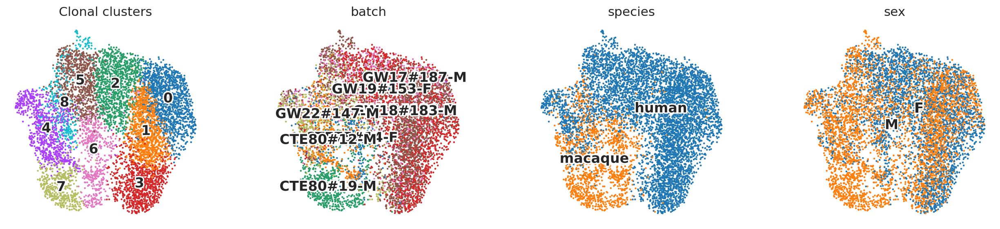

In [15]:
sc.tl.leiden(clones, resolution=.8)

sc.pl.umap(
    clones,
    color=["leiden","batch",'species','sex'],
    frameon=False,
    title="Clonal clusters",
    legend_loc="on data",
    legend_fontsize=15,
    legend_fontoutline=3
)

/wynton/home/pollenlab/jding/miniconda3/envs/cospar/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


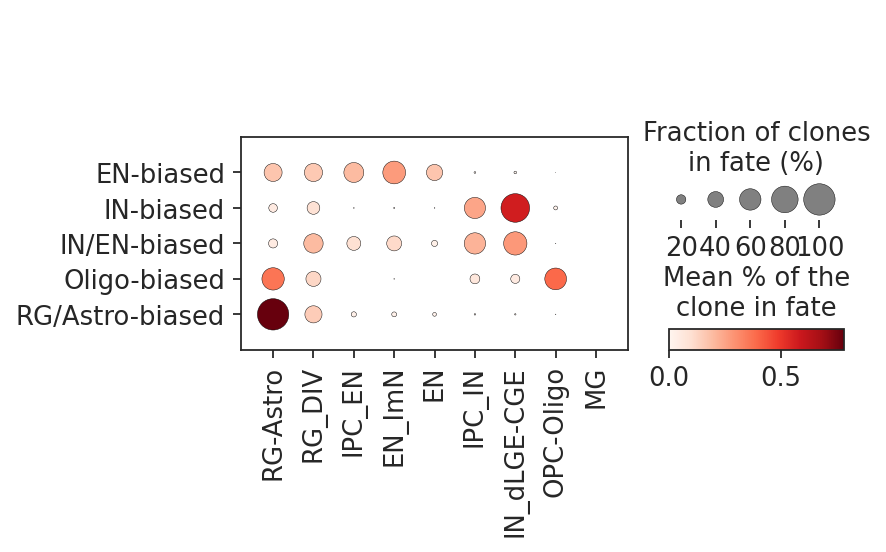

In [24]:
sc.pl.dotplot(
    clones[clones.obs['species'] == 'human'],
    var_names=['RG-Astro', 'RG_DIV','IPC_EN', 'EN_ImN','EN', 'IPC_IN','IN_dLGE-CGE',  'OPC-Oligo',  'MG' ],
    groupby="Clonal cluster",
    layer="frequencies",
    colorbar_title="Mean % of the\nclone in fate",
    cmap="Reds",
    swap_axes=False,
    size_title="Fraction of clones\nin fate (%)",
    #title="Distribution of fates across clonal clusters",
    dot_max=1,
    save = "scLiTr_human"
)

/wynton/home/pollenlab/jding/miniconda3/envs/cospar/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


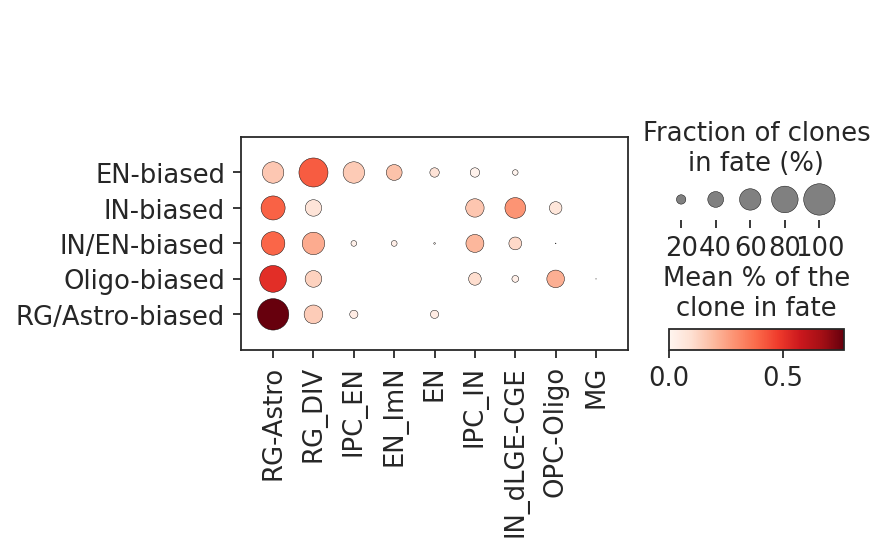

In [25]:
sc.pl.dotplot(
    clones[clones.obs['species'] == 'macaque'],
    var_names=['RG-Astro', 'RG_DIV','IPC_EN', 'EN_ImN','EN', 'IPC_IN','IN_dLGE-CGE',  'OPC-Oligo',  'MG' ],
    groupby="Clonal cluster",
    layer="frequencies",
    colorbar_title="Mean % of the\nclone in fate",
    cmap="Reds",
    swap_axes=False,
    size_title="Fraction of clones\nin fate (%)",
    #title="Distribution of fates across clonal clusters",
    dot_max=1,
    save = "scLiTr_macaque"
)

In [130]:
sl.tl.transfer_clonal_annotation(
    adata,
    clones,
    adata_clone_name="unique_clone",
    adata_obs_name="Clonal cluster",
    clones_obs_name="leiden",
    fill_values="NA",
)

/wynton/home/pollenlab/jding/miniconda3/envs/cospar/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/wynton/home/pollenlab/jding/miniconda3/envs/cospar/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(
/wynton/home/pollenlab/jding/miniconda3/envs/cospar/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(
/wynton/home/pollenlab/jding/miniconda3/envs/cospar/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/wynton/home/pollenlab/jding/miniconda3/envs/cospar/lib/pyth

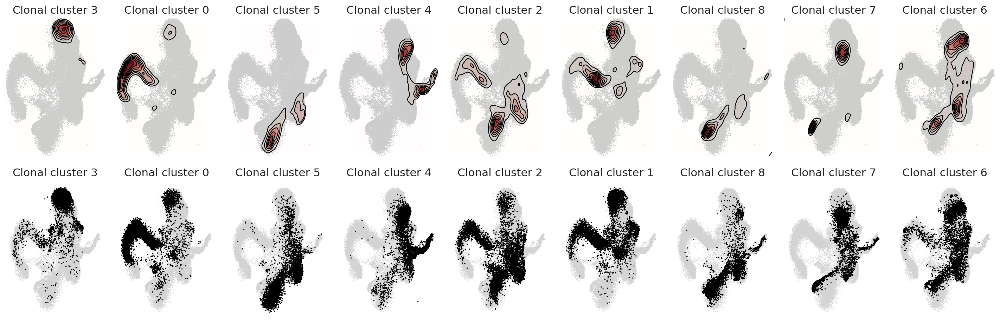

In [18]:
fig, axes = plt.subplots(ncols=len(clones.obs['leiden'].unique()), nrows=2, figsize=(18, 6))

for i, clonal_cluster in enumerate(clones.obs['leiden'].unique()):
    sl.pl.kde(
        adata,
        basis="X_umap",
        groupby="Clonal cluster",
        group=clonal_cluster,
        title=f"Clonal cluster {clonal_cluster}",
        ax=axes[0, i],
    )

    sl.pl.clone(
        adata,
        clone_col="Clonal cluster",
        clone_name=clonal_cluster,
        basis="X_umap",
        title=f"Clonal cluster {clonal_cluster}",
        s=10,
        ax=axes[1, i],
    )

fig.tight_layout()

In [25]:
old_to_new = {
    '0':'EN-biased',
    '1':'EN-biased',
    '2':'IN/EN-biased',
    '3':'RG/Astro-biased',
    '4':'Oligo-biased',
    '5':'IN-biased',
    '6':'IN/EN-biased',
    '7':'IN-biased',
    '8':'IN-biased'
}
adata.obs['Clonal cluster'] = (
    adata.obs['Clonal cluster']
    .map(old_to_new)
    .astype('category')
)
clones.obs['Clonal cluster'] = (
    clones.obs['leiden']
    .map(old_to_new)
    .astype('category')
)

In [146]:
sl.tl.transfer_clonal_annotation(
    adata,
    clones,
    adata_clone_name="unique_clone",
    adata_obs_name="Clonal cluster",
    clones_obs_name="Clonal cluster",
    fill_values="NA",
)

In [147]:
sl.tl.transfer_clonal_annotation(
    adata,
    clones,
    adata_clone_name="unique_clone",
    adata_obs_name="Clonal cluster",
    clones_obs_name="Clonal cluster",
    fill_values="NA",
)

/wynton/home/pollenlab/jding/miniconda3/envs/cospar/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/wynton/home/pollenlab/jding/miniconda3/envs/cospar/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(
/wynton/home/pollenlab/jding/miniconda3/envs/cospar/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(
/wynton/home/pollenlab/jding/miniconda3/envs/cospar/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/wynton/home/pollenlab/jding/miniconda3/envs/cospar/lib/pyth

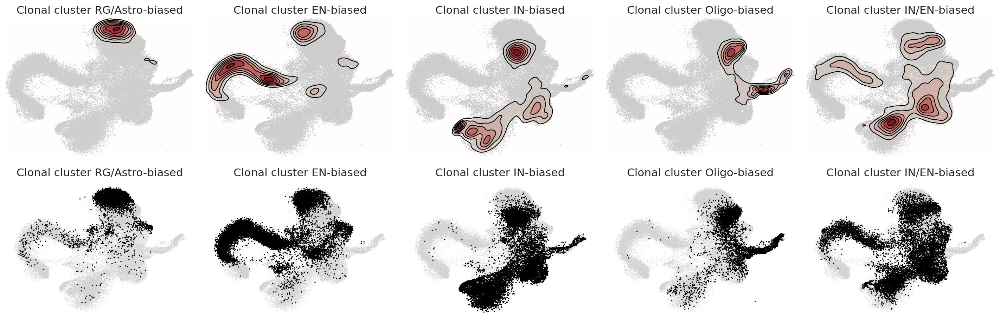

In [27]:
fig, axes = plt.subplots(ncols=len(clones.obs['Clonal cluster'].unique()), nrows=2, figsize=(18, 6))

for i, clonal_cluster in enumerate(clones.obs['Clonal cluster'].unique()):
    sl.pl.kde(
        adata,
        basis="X_umap",
        groupby="Clonal cluster",
        group=clonal_cluster,
        title=f"Clonal cluster {clonal_cluster}",
        ax=axes[0, i],
    )

    sl.pl.clone(
        adata,
        clone_col="Clonal cluster",
        clone_name=clonal_cluster,
        basis="X_umap",
        title=f"Clonal cluster {clonal_cluster}",
        s=10,
        ax=axes[1, i],
    )

fig.tight_layout()

In [16]:
clones.obs.groupby(["gene_NKS", "Clonal cluster", "batch"]).size().reset_index(name="count").to_csv('/wynton/group/pollen/jding/brainchromatin/scLiTr.csv')

In [51]:
clones.write('/wynton/group/pollen/jding/brainchromatin/HM2D/scLiTr.h5ad')

In [62]:
adata.write('/wynton/group/pollen/jding/brainchromatin/HM2D/HM2D-filtered_guides_scLiTr.h5ad', compression='gzip')

In [142]:
adata = adata[adata.obs['class'] == 'Radial Glia']

/wynton/home/pollenlab/jding/miniconda3/envs/pertpy/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/wynton/home/pollenlab/jding/miniconda3/envs/pertpy/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


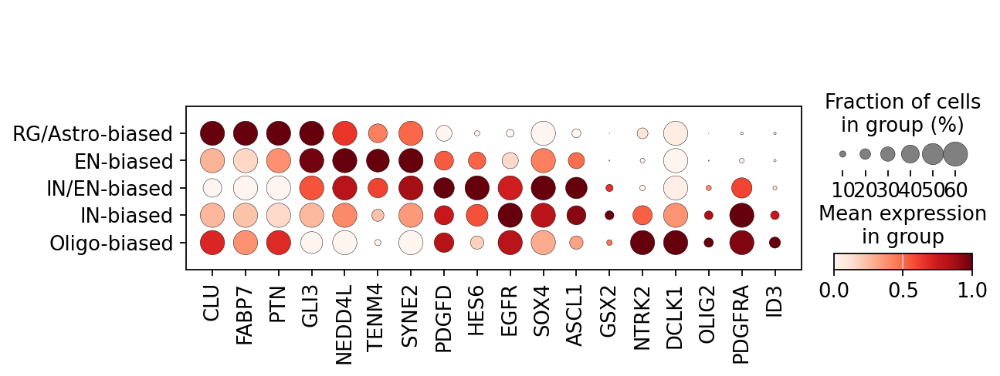

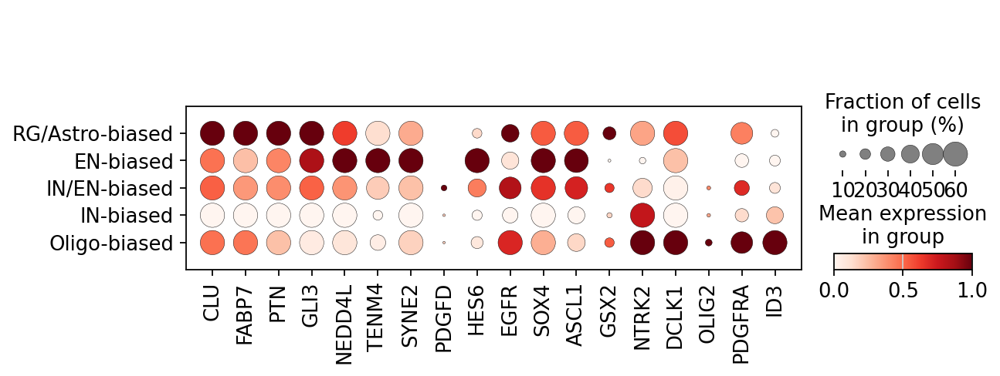

In [157]:
genes = ['CLU','FABP7','PTN','GLI3','NEDD4L','TENM4','SYNE2','PDGFD','HES6','EGFR','SOX4','ASCL1','GSX2','NTRK2','DCLK1','OLIG2','PDGFRA','ID3'] 
dp = sc.pl.dotplot(adata[adata.obs['species'] == 'human'], genes, 
                   'Clonal cluster', categories_order = ['RG/Astro-biased','EN-biased','IN/EN-biased','IN-biased','Oligo-biased'],
                                 standard_scale='var',dot_max=0.6,cmap='Reds', return_fig=True)
dp.savefig("./figures/dotplot-RG.clones.human.pdf")
dp = sc.pl.dotplot(adata[adata.obs['species'] == 'macaque'], genes, 
                   'Clonal cluster', categories_order = ['RG/Astro-biased','EN-biased','IN/EN-biased','IN-biased','Oligo-biased'],
                                 standard_scale='var',dot_max=0.6,cmap='Reds', return_fig=True)
dp.savefig("./figures/dotplot-RG.clones.macaque.pdf")

/wynton/home/pollenlab/jding/miniconda3/envs/pertpy/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:582: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


/wynton/home/pollenlab/jding/miniconda3/envs/pertpy/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


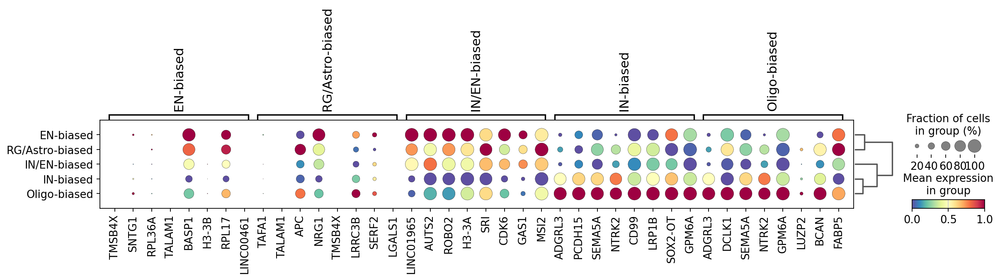

In [156]:
sc.tl.rank_genes_groups(adata[adata.obs['species'] == 'macaque'], groupby='Clonal cluster', 
                        method='wilcoxon',
                        key_added='wilcoxon',n_genes=50)
sc.pl.rank_genes_groups_dotplot(adata[adata.obs['species'] == 'macaque'],groupby='Clonal cluster',
                                cmap='Spectral_r',
                                 standard_scale='var',
                                       n_genes=8,key='wilcoxon')

/wynton/home/pollenlab/jding/miniconda3/envs/pertpy/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


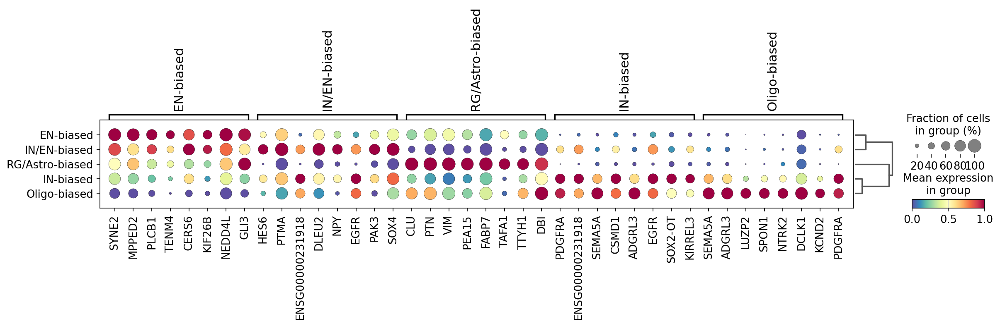

In [106]:
sc.tl.rank_genes_groups(adata, groupby='Clonal cluster', 
                        method='wilcoxon',
                        key_added='wilcoxon',n_genes=50)
sc.pl.rank_genes_groups_dotplot(adata,groupby='Clonal cluster',
                                cmap='Spectral_r',
                                 standard_scale='var',
                                       n_genes=8,key='wilcoxon')